In [12]:
import os
import cv2
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
import albumentations as A
import seaborn as sns
from skimage import exposure
from skimage import transform as tf
from tqdm import tqdm
from pathlib import Path
from skimage.filters import gaussian
from skimage.segmentation import slic
from skimage import exposure
import cv2
from skimage import exposure
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from sklearn.metrics import confusion_matrix, accuracy_score

from keras import Sequential, Input, Model
from keras.layers import Conv2D, MaxPooling2D, Dense, Flatten, Dropout, BatchNormalization, Dropout

In [13]:
def process_img(filepath):
    filenames = list(Path(filepath).glob(r'**/*{}'.format('jpg')))
    labels = list(map(lambda x: os.path.split(os.path.split(x)[0])[1], filenames))

    filepaths = pd.Series(filenames, name='Filepath').astype(str)
    labels = pd.Series(labels, name='Label')

    image_df = pd.concat([filepaths, labels], axis=1)
    return image_df.sample(frac=1)

In [16]:
# Access California Data
cali_train_path = '/Users/aashigoyal/Desktop/vscode/aashimain/aisd_whole/Data/California/train'
cali_test_path = '/Users/aashigoyal/Desktop/vscode/aashimain/aisd_whole/Data/California/test'
cali_val_path = '/Users/aashigoyal/Desktop/vscode/aashimain/aisd_whole/Data/California/valid'

# Process Data
cali_train_df = process_img(cali_train_path)
cali_val_df = process_img(cali_test_path)
cali_test_df = process_img(cali_val_path)

In [17]:
cali_train_df

,Filepath,Label
89,/Users/aashigoyal/Desktop/vscode/aashimain/ais...,nowildfire
824,/Users/aashigoyal/Desktop/vscode/aashimain/ais...,nowildfire
1152,/Users/aashigoyal/Desktop/vscode/aashimain/ais...,wildfire
995,/Users/aashigoyal/Desktop/vscode/aashimain/ais...,nowildfire
313,/Users/aashigoyal/Desktop/vscode/aashimain/ais...,nowildfire
...,...,...
812,/Users/aashigoyal/Desktop/vscode/aashimain/ais...,nowildfire
1291,/Users/aashigoyal/Desktop/vscode/aashimain/ais...,wildfire
1879,/Users/aashigoyal/Desktop/vscode/aashimain/ais...,wildfire
249,/Users/aashigoyal/Desktop/vscode/aashimain/ais...,nowildfire


In [18]:
# Access Canada Data
can_train_path = '/Users/aashigoyal/Desktop/vscode/aashimain/aisd_whole/Data/Canada/train'
can_test_path = '/Users/aashigoyal/Desktop/vscode/aashimain/aisd_whole/Data/Canada/test'
can_val_path = '/Users/aashigoyal/Desktop/vscode/aashimain/aisd_whole/Data/Canada/valid'

# Process Data
can_train_df = process_img(can_train_path)
can_val_df = process_img(can_val_path)
can_test_df = process_img(can_test_path)

In [19]:
print(can_train_df.shape)
print(can_test_df.shape)
print(can_val_df.shape)

(30250, 2)
(6300, 2)
(6310, 2)


In [20]:
can_train_df=can_train_df.sample(frac=0.07,random_state=1)
can_test_df=can_test_df.sample(frac=0.07,random_state=1)
can_val_df=can_val_df.sample(frac=0.07,random_state=1)

In [21]:
print(can_train_df.shape)
print(can_test_df.shape)
print(can_val_df.shape)

(2118, 2)
(441, 2)
(442, 2)


In [22]:
def show_image_sample(df, num_images=16):
    selected_data = df.head(num_images)
    fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(10, 10),
                        subplot_kw={'xticks': [], 'yticks': []})

    for i, ax in enumerate(axes.flat):
        ax.imshow(plt.imread(selected_data.iloc[i].Filepath))
        ax.set_title(selected_data.iloc[i].Label)
    plt.tight_layout()
    plt.show()

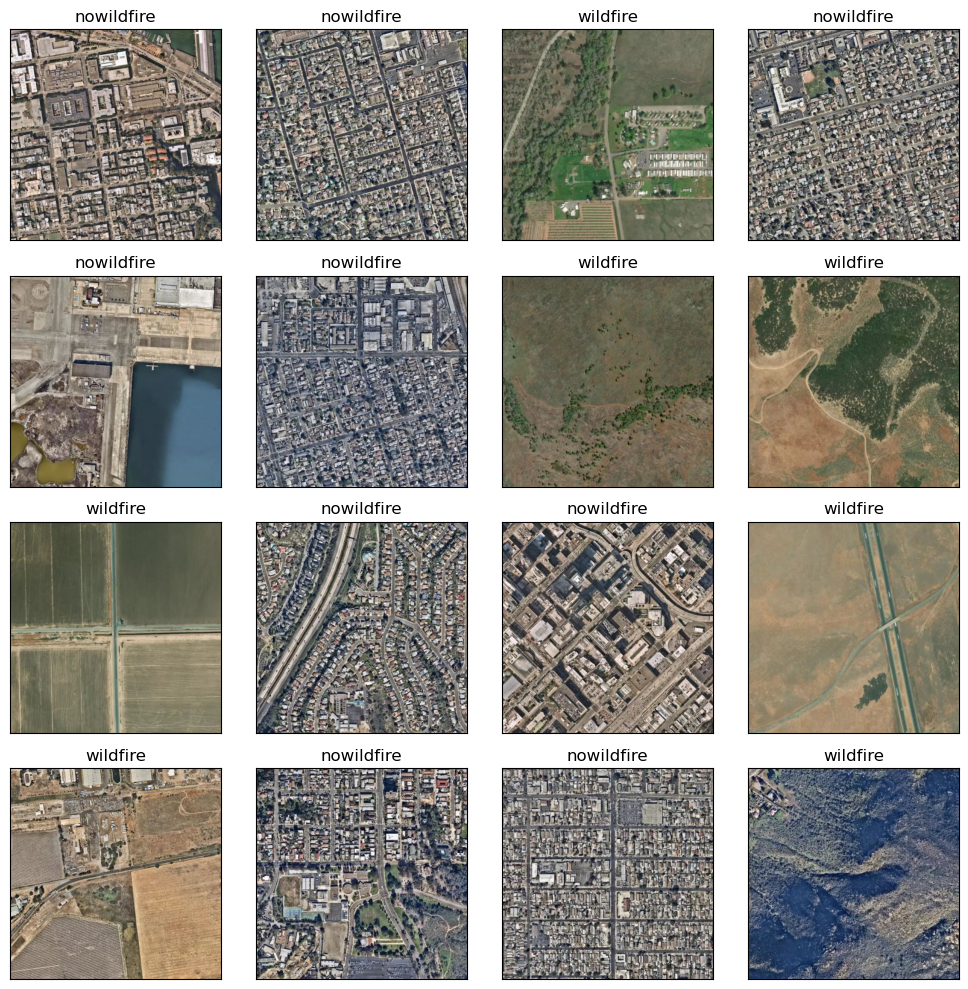

In [23]:
show_image_sample(cali_train_df)

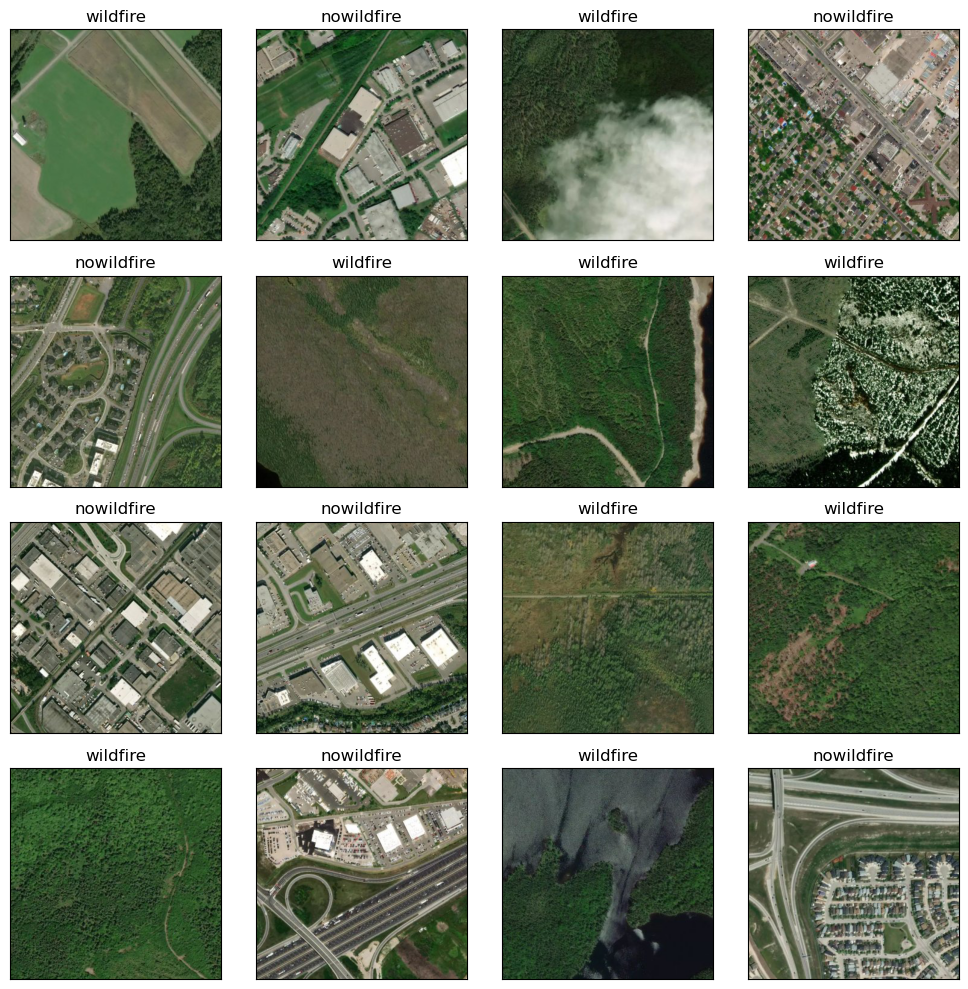

In [24]:
show_image_sample(can_train_df)

DATA PREPROCESSING

In [25]:

def atmospheric_correction(image):
    # Apply histogram equalization for atmospheric correction
    equalized_image = exposure.equalize_hist(image)
    return equalized_image

def apply_correction_batch(df, batch_size=500):
    processed_images = []
    processed_labels = []

    for i in range(0, len(df), batch_size):
        batch_df = df[i:i+batch_size]
        for filepath in tqdm(batch_df['Filepath'], desc=f'Processing batch {i//batch_size}', unit='image'):
            # Read and process the image
            image = cv2.imread(str(filepath), cv2.IMREAD_GRAYSCALE)
            corrected_image = atmospheric_correction(image)

            # Store processed images and labels
            processed_images.append(corrected_image)
            processed_labels.append(batch_df['Label'].iloc[0])

    # Create a new DataFrame with processed images and labels
    processed_df = pd.DataFrame({
        'Processed_Image': processed_images,
        'Label': processed_labels
    })

    return processed_df


In [26]:
# Preprocess the California dataframes
cali_train_processed_df = apply_correction_batch(cali_train_df)
cali_val_processed_df = apply_correction_batch(cali_val_df)
cali_test_processed_df = apply_correction_batch(cali_test_df)

Processing batch 0:   0%|          | 0/500 [00:00<?, ?image/s]

Processing batch 0: 100%|██████████| 429/429 [00:01<00:00, 230.30image/s]


In [27]:
# Preprocess the Canada dataframes
can_train_processed_df = apply_correction_batch(can_train_df)

Processing batch 4: 100%|██████████| 118/118 [00:00<00:00, 253.51image/s]


In [28]:
can_test_processed_df = apply_correction_batch(can_test_df)

Processing batch 0: 100%|██████████| 441/441 [00:01<00:00, 250.83image/s]


In [29]:
can_val_processed_df = apply_correction_batch(can_val_df)

Processing batch 0: 100%|██████████| 442/442 [00:01<00:00, 251.80image/s]


In [30]:
cali_train_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1993 entries, 89 to 947
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   Filepath  1993 non-null   object
 1   Label     1993 non-null   object
dtypes: object(2)
memory usage: 46.7+ KB


In [31]:
cali_train_processed_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1993 entries, 0 to 1992
Data columns (total 2 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   Processed_Image  1993 non-null   object
 1   Label            1993 non-null   object
dtypes: object(2)
memory usage: 31.3+ KB


In [32]:
def show_processed_image_sample(df, num_images=16):
    selected_data = df.head(num_images)
    fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(10, 10),
                        subplot_kw={'xticks': [], 'yticks': []})

    for i, ax in enumerate(axes.flat):
        image = selected_data.iloc[i]['Processed_Image']

        ax.imshow(image)
        ax.set_title("Image "+str(i))
        ax.axis('off')

    plt.tight_layout()
    plt.show()

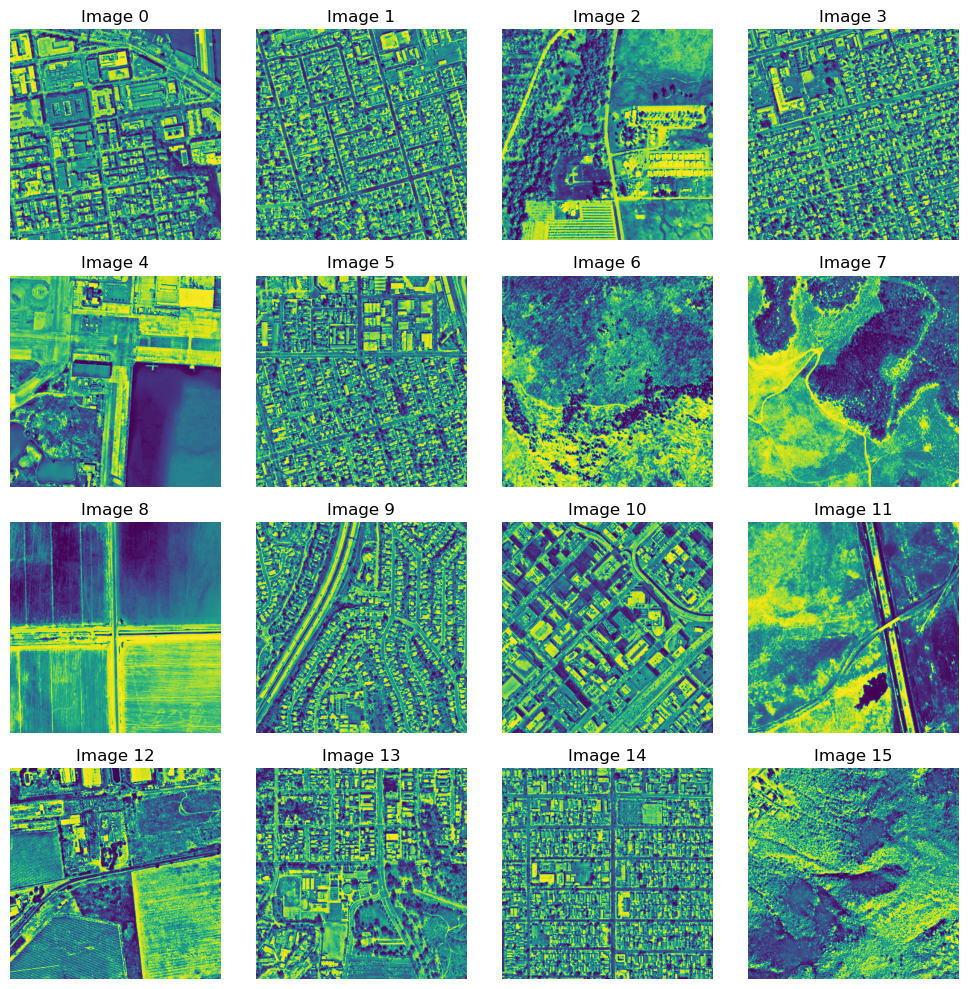

In [34]:
show_processed_image_sample(cali_train_processed_df)

In [35]:
# 2. Gaussian Smoothening
def smooth_image(image, sigma=0.8):
    smoothed_image = gaussian(image, sigma=sigma)
    return smoothed_image
def apply_smoothing_batch(processed_df, batch_size=250):
    smoothed_images = []

    # Process images in batches
    for i in range(0, len(processed_df), batch_size):
        batch_df = processed_df[i:i + batch_size]
        for image in tqdm(batch_df['Processed_Image'], desc=f'Applying Smoothing to batch {i//batch_size}', unit='image'):
            # Apply smoothing to each image in the batch
            smoothed_image = smooth_image(image, sigma=0.8)
            smoothed_images.append(smoothed_image)

    # Add the list of smoothed images to the DataFrame
    processed_df['Smoothed_Image'] = smoothed_images
    return processed_df



In [36]:
cali_train_processed_df = apply_smoothing_batch(cali_train_processed_df)
cali_val_processed_df = apply_smoothing_batch(cali_val_processed_df)
cali_test_processed_df = apply_smoothing_batch(cali_test_processed_df)

Applying Smoothing to batch 1: 100%|██████████| 179/179 [00:00<00:00, 1025.71image/s]


In [37]:
can_train_processed_df = apply_smoothing_batch(can_train_processed_df)

Applying Smoothing to batch 8: 100%|██████████| 118/118 [00:00<00:00, 188.74image/s]


In [38]:
can_test_processed_df = apply_smoothing_batch(can_test_processed_df)
can_val_processed_df = apply_smoothing_batch(can_val_processed_df)

Applying Smoothing to batch 1: 100%|██████████| 192/192 [00:01<00:00, 160.76image/s]


In [39]:
cali_train_processed_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1993 entries, 0 to 1992
Data columns (total 3 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   Processed_Image  1993 non-null   object
 1   Label            1993 non-null   object
 2   Smoothed_Image   1993 non-null   object
dtypes: object(3)
memory usage: 46.8+ KB


In [40]:
def show_smoothed_image_sample(df, num_images=16):
    selected_data = df.head(num_images)
    fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(10, 10),
                        subplot_kw={'xticks': [], 'yticks': []})

    for i, ax in enumerate(axes.flat):
        image = selected_data.iloc[i]['Smoothed_Image']

        ax.imshow(image)
        ax.set_title("Image "+str(i))
        ax.axis('off')

    plt.tight_layout()
    plt.show()

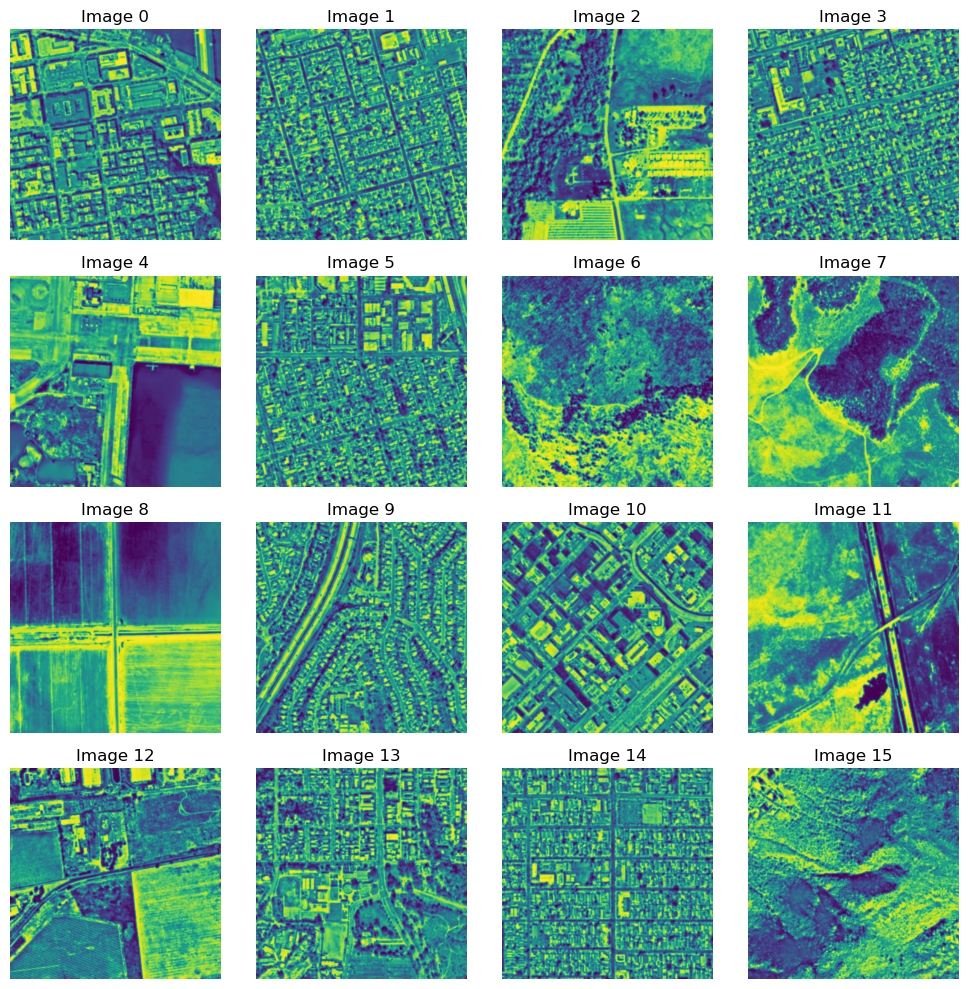

In [41]:
show_smoothed_image_sample(cali_train_processed_df)

In [42]:
#Feature extraction using Gabor filtering
from tqdm import tqdm
import cv2
import numpy as np
from scipy import ndimage as ndi
from joblib import Parallel, delayed

# Gabor filter bank
orientations = 1  # Reduced to 1 orientation
kernels = []

for sigma in (1, 3):
    for frequency in (0.1, 0.2):  # Adjusted frequency values
        # Include the 'lambd' parameter in the getGaborKernel function
        kernel = np.real(cv2.getGaborKernel((100, 100), sigma, theta=0, lambd=5,
                                            gamma=0.5, psi=0, ktype=cv2.CV_32F))
        kernels.append(kernel)

def extract_gabor_features(image):
    feats = np.zeros((len(kernels), 2), dtype=np.double)
    for k, kernel in enumerate(kernels):
        filtered = ndi.convolve(image, kernel, mode='wrap')
        feats[k, 0] = filtered.mean()
        feats[k, 1] = filtered.var()
    return feats

def process_image(image):
    feats = extract_gabor_features(image)
    return feats

def apply_gabor_filtering_batch(df, batch_size=500):
    all_gabor_features = []

    # Process images in batches
    for i in range(0, len(df), batch_size):
        batch_df = df[i:i + batch_size]
        batch_features = Parallel(n_jobs=-1)(delayed(process_image)(image) for image in tqdm(batch_df['Processed_Image'], desc=f'Gabor Filtering batch {i//batch_size}', unit='image'))
        all_gabor_features.extend(batch_features)

    # Add the extracted features to the DataFrame
    df['Gabor_Features'] = all_gabor_features
    return df



In [43]:
cali_train_processed_df = apply_gabor_filtering_batch(cali_train_processed_df)
cali_test_processed_df = apply_gabor_filtering_batch(cali_test_processed_df)

Gabor Filtering batch 0: 100%|██████████| 429/429 [02:06<00:00,  3.40image/s]


In [44]:
cali_val_processed_df = apply_gabor_filtering_batch(cali_val_processed_df)

Gabor Filtering batch 0: 100%|██████████| 429/429 [02:08<00:00,  3.34image/s]


In [45]:
can_train_processed_df = apply_gabor_filtering_batch(can_train_processed_df)

Gabor Filtering batch 4: 100%|██████████| 118/118 [00:32<00:00,  3.63image/s]


In [46]:
can_test_processed_df = apply_gabor_filtering_batch(can_test_processed_df)

Gabor Filtering batch 0: 100%|██████████| 441/441 [02:08<00:00,  3.43image/s]


In [47]:
can_val_processed_df = apply_gabor_filtering_batch(can_val_processed_df)

Gabor Filtering batch 0: 100%|██████████| 442/442 [02:10<00:00,  3.39image/s]


In [48]:
cali_train_processed_df.head()

,Processed_Image,Label,Smoothed_Image,Gabor_Features
0,"[[0.8677795918367347, 0.877265306122449, 0.816...",nowildfire,"[[0.84039812324923, 0.8321735861139509, 0.7931...","[[2.8678110253865006, 1.6630655077521508], [2...."
1,"[[0.22839183673469388, 0.19953469387755102, 0....",nowildfire,"[[0.23141725721807815, 0.2343092126609256, 0.3...","[[2.868001368373686, 1.372065797061941], [2.86..."
2,"[[0.04889795918367347, 0.04889795918367347, 0....",nowildfire,"[[0.08561219624065071, 0.06795510065061222, 0....","[[2.8906725264104476, 2.0478372644465668], [2...."
3,"[[0.09280816326530612, 0.18911020408163265, 0....",nowildfire,"[[0.23389134270018141, 0.2666897771602952, 0.2...","[[2.8679939247953063, 1.356532827745964], [2.8..."
4,"[[0.8671020408163266, 0.8397714285714286, 0.82...",nowildfire,"[[0.8840956052389611, 0.8632596456655652, 0.84...","[[2.875967220790467, 2.280246820225365], [2.87..."


In [49]:
can_train_processed_df.head()

,Processed_Image,Label,Smoothed_Image,Gabor_Features
0,"[[0.19275102040816328, 0.16583673469387755, 0....",wildfire,"[[0.19274366799546178, 0.17102397403048483, 0....","[[2.9119080844461216, 2.5171768862930364], [2...."
1,"[[0.30951836734693877, 0.2714857142857143, 0.2...",wildfire,"[[0.2869342083283781, 0.2706355343803441, 0.25...","[[2.8725961831882905, 2.3224483444847044], [2...."
2,"[[0.28691428571428573, 0.2769061224489796, 0.0...",wildfire,"[[0.2635561723718712, 0.22111796529593622, 0.1...","[[2.872506830210301, 2.542545278981534], [2.87..."
3,"[[0.4392326530612245, 0.4473795918367347, 0.48...",wildfire,"[[0.45420996095685023, 0.4560792651460704, 0.4...","[[2.871261768629778, 2.0182144719334105], [2.8..."
4,"[[0.5652734693877551, 0.6827591836734694, 0.96...",wildfire,"[[0.6732772681357969, 0.7692919425281117, 0.89...","[[2.880203825990325, 2.102970629708161], [2.88..."


In [50]:
print(can_train_processed_df['Gabor_Features'][0])

[[2.91190808 2.51717689]
 [2.91190808 2.51717689]
 [0.04733422 0.69683932]
 [0.04733422 0.69683932]]


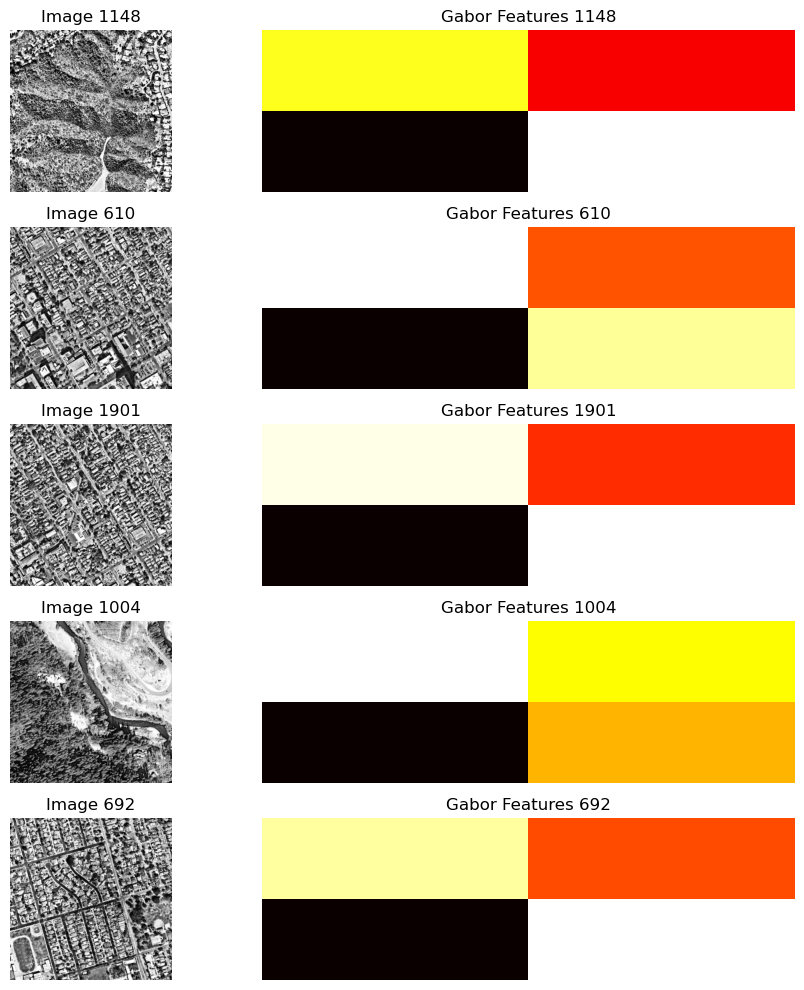

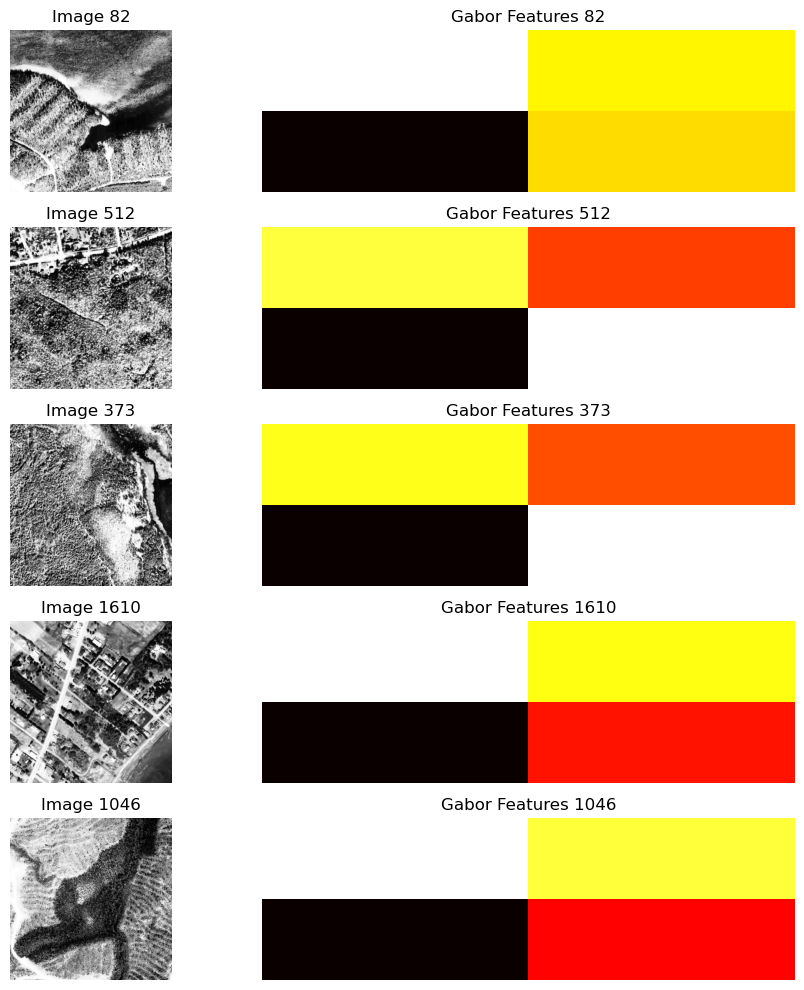

In [51]:
import matplotlib.pyplot as plt
import numpy as np

def plot_gabor_features(df, num_images=5):
    # Select a subset of images to visualize
    subset = df.sample(n=num_images)

    # Create a figure with subplots
    fig, axes = plt.subplots(num_images, 2, figsize=(10, num_images * 2))

    # Iterate over the selected subset
    for i, (index, row) in enumerate(subset.iterrows()):
        # Extract the Gabor features
        gabor_features = row['Gabor_Features']
        
        # Plot the original image
        axes[i, 0].imshow(row['Processed_Image'], cmap='gray')
        axes[i, 0].set_title(f'Image {index}')
        axes[i, 0].axis('off')

        # Plot the Gabor features
        # Assuming gabor_features is a 2D array where each row is a feature
        axes[i, 1].imshow(gabor_features, cmap='hot', aspect='auto')
        axes[i, 1].set_title(f'Gabor Features {index}')
        axes[i, 1].axis('off')

    plt.tight_layout()
    plt.show()

# Example usage for California dataset
plot_gabor_features(cali_train_processed_df)

# Example usage for Canada dataset
plot_gabor_features(can_train_processed_df)
